# Genre Prediction

## What are the 10 most popular genres per decade on spotify?

### Import Libraries

### Load Dataset

In [3]:
df_sptfy = pd.read_csv('data/billboard-lyrics-spotify.csv')
print(df_sptfy.shape)
df_sptfy = df_sptfy[df_sptfy['num_words'] > 1]
df_sptfy.dropna(subset=['lyrics'], inplace=True)
print(df_sptfy.shape)

(5566, 30)
(5491, 30)


In [3]:
df_sptfy.head(3)

,artist_all,artist_base,rank,song,year,artist_featured,song_clean,artist_clean,lyrics,acousticness,...,speechiness,tempo,time_signature,valence,duration_min,num_words,words_per_sec,num_uniq_words,decade,uniq_ratio
0,percy faith,percy faith,1,theme from a summer place,1960,NaN,theme from a summer place,percy faith,theres a summer place where it may rain or sto...,0.631,...,0.0253,92.631,4.0,0.749,2.414883,104.0,0.717771,58.0,1960,1.793103
1,jim reeves,jim reeves,2,he'll have to go,1960,NaN,hell have to go,jim reeves,put your sweet lips a little closer to the pho...,0.909,...,0.0379,81.181,3.0,0.200,2.310667,152.0,1.096365,69.0,1960,2.202899
2,the everly brothers,the everly brothers,3,cathy's clown,1960,NaN,cathys clown,the everly brothers,dont want your love any more dont want your k...,0.412,...,0.0339,119.809,4.0,0.866,2.400217,121.0,0.840202,64.0,1960,1.890625


In [4]:
# Do we still need these two blocks?:

This is not scientifically proven but as a simplification, I'm adding a sentiment column with either 'positive' (1) or 'negative' (0), depending on the valence. Calculated where >50 valence is positive and <50 valence is negative. In Spotify's API is something called Valence, that describes the musical positiveness conveyed by a track. Tracks with high valence sound more positive (happy, cheerful, euphoric), while tracks with low valence sound more negative (sad, depressed, angry).

In [5]:
df_sptfy['sentiment'] = df_sptfy['valence'].apply(lambda x: 1 if x > 0.5 else 0)

### Dataset statistics

In [4]:
print('There are', len(df_sptfy), 'songs in the dataset')
print('The earliest year in the dataset is from', df_sptfy['year'].min())
print('The latest year in the dataset is from', df_sptfy['year'].max())
print('The shortest lyrics are', df_sptfy['num_words'].min(), 'words in length')
print('The longest lyrics are', df_sptfy['num_words'].max(), 'words in length')
print('The fastest tempo in the dataset is', df_sptfy['tempo'].max())
print('The shortest tempo in the dataset is', df_sptfy['tempo'].min())
print('The average tempo in the dataset is', df_sptfy['tempo'].mean())
print('There are', df_sptfy['artist_clean'].nunique(), 'unique artists')

There are 5491 songs in the dataset
The earliest year in the dataset is from 1960
The latest year in the dataset is from 2017
The shortest lyrics are 5.0 words in length
The longest lyrics are 1143.0 words in length
The fastest tempo in the dataset is 233.429
The shortest tempo in the dataset is 50.975
The average tempo in the dataset is 119.34795571401764
There are 2229 unique artists


### Filter by decade

In [5]:
value_counts = df_sptfy['decade'].value_counts()

grouped_data = df_sptfy.groupby('decade')

for value, group in grouped_data:
    group_name = f"df_year_{value}"  # Creating a unique name for each DataFrame
    globals()[group_name] = group.copy()

In [6]:
for value in value_counts.index:
    global_variable_name = f"df_year_{value}"
    print(f"{global_variable_name} has {len(globals()[global_variable_name])} entries")

df_year_1980 has 991 entries
df_year_1970 has 981 entries
df_year_1960 has 960 entries
df_year_1990 has 931 entries
df_year_2000 has 919 entries
df_year_2010 has 709 entries


### Apply NER model to each all lyrics in each decade

In [7]:
nlp = spacy.load('en_core_web_lg')
for value in value_counts.index:
    df = f"df_year_{value}"
    list_name = f"lyrics_{value}"
    globals()[list_name] = []
    for song in globals()[df]['lyrics']:
        globals()[list_name].append(nlp(song))

### Evaluate most common entities per decade

In [8]:
for value in value_counts.index: 
    c = Counter()
    sum_entities = 0

    for song in globals()[f'lyrics_{value}']:
        sum_entities += len(song.ents)
        c.update([e.label_ for e in song.ents])

    average_entities = sum_entities / len(globals()[f'df_year_{value}'])

    print(f'Decade: {value}')
    print('Average entities per document:', average_entities)
    print('\nAverage entity type per document:')
    for item in c:
        print(item, c[item] / len(globals()[f'df_year_{value}']))
    print()


Decade: 1980
Average entities per document: 3.8708375378405653

Average entity type per document:
DATE 0.5267406659939455
PERSON 0.8012108980827447
TIME 1.099899091826438
CARDINAL 0.6881937436932392
GPE 0.26538849646821394
ORDINAL 0.1846619576185671
NORP 0.05852674066599395
ORG 0.18668012108980828
QUANTITY 0.01917255297679112
MONEY 0.007063572149344097
LOC 0.02119071644803229
PRODUCT 0.007063572149344097
LAW 0.0010090817356205853
FAC 0.0020181634712411706
EVENT 0.0020181634712411706

Decade: 1970
Average entities per document: 3.8868501529051986

Average entity type per document:
DATE 0.7033639143730887
NORP 0.08256880733944955
PERSON 0.928644240570846
CARDINAL 0.601427115188583
TIME 0.7145769622833843
ORG 0.21508664627930682
GPE 0.37716615698267075
ORDINAL 0.1365953109072375
PRODUCT 0.01834862385321101
LOC 0.03160040774719674
QUANTITY 0.05198776758409786
FAC 0.011213047910295617
LANGUAGE 0.0010193679918450561
MONEY 0.011213047910295617
LAW 0.0020387359836901123

Decade: 1960
Average e

In [9]:
# Most common span per entity type per decade

for value in value_counts.index:
    c = Counter()

    for song in globals()[f'lyrics_{value}']:
        for ent in song.ents:
            # Ensure the entity label is present in the Counter
            if ent.label_ not in c:
                c[ent.label_] = []
            c[ent.label_].append(ent.text)

    print(f'Decade: {value}')
    for item in c:
        most_common_text = Counter(c[item]).most_common(1)
        if most_common_text:
            most_common_text = most_common_text[0][0]
        else:
            most_common_text = "No Data"
        print(item, most_common_text)
    print()

Decade: 1980
DATE today
PERSON mickey
TIME tonight
CARDINAL one
GPE america
ORDINAL second
NORP sans
ORG muzik
QUANTITY a million miles
MONEY a million bucks
LOC africa
PRODUCT batman
LAW chapter two
FAC muezzin
EVENT world war iii

Decade: 1970
DATE today
NORP american
PERSON louie louie
CARDINAL one
TIME tonight
ORG chevy
GPE new york
ORDINAL first
PRODUCT cherokee
LOC memphis
QUANTITY a mile
FAC vicksburg around louisiana
LANGUAGE english
MONEY forty cents
LAW the y m

Decade: 1960
DATE today
CARDINAL one
GPE california
NORP indian
TIME tonight
LOC nova
ORG bristol
PERSON rhonda
ORDINAL first
QUANTITY twenty miles
MONEY fifty cents
FAC la la la la
PRODUCT surry
PERCENT 4 h
EVENT hawaii five

Decade: 1990
DATE today
TIME tonight
PERSON joe
CARDINAL one
ORDINAL first
LOC east coast
QUANTITY a thousand miles
LAW the y y
ORG cmon
NORP dem
GPE brooklyn
FAC the choo choo
PRODUCT bmw
MONEY a penny
EVENT nine eleven
PERCENT fifteen percent
LANGUAGE english

Decade: 2000
PERSON dj
NORP dem
G

In [13]:
# Make this into a loop, repeating for each decade in globals() ?

# label = Counter()
# text = Counter()
# total = Counter()
# for song in globals()['lyrics_1960']:
#     label.update([ent.label_ for ent in song.ents])
#     text.update([ent.text for ent in song.ents])
#     total.update([(ent.text, ent.label_) for ent in song.ents])
# print('1960 total counts:', total)
# print('1960 label counts:', label)
# print('1960 text counts:', text)


In [10]:
def analyze_lyrics(lyrics, decade):
    label_counter = Counter()
    text_counter = Counter()
    total_counter = Counter()

    for song in lyrics:
        filtered_ents = [ent.text for ent in song.ents if ent.text.lower() not in stopwords.words('english')]
        
        label_counter.update([ent.label_ for ent in song.ents])
        text_counter.update(filtered_ents)
        total_counter.update([(ent.text, ent.label_) for ent in song.ents])

    # Create DataFrames
    label_df = pd.DataFrame.from_dict(label_counter, orient='index', columns=[f'{decade}_label_count'])
    text_df = pd.DataFrame.from_dict(text_counter, orient='index', columns=[f'{decade}_text_count'])
    total_df = pd.DataFrame.from_dict(total_counter, orient='index', columns=[f'{decade}_total_count'])
    
    label_df = label_df.sort_values(by=[f'{decade}_label_count'], ascending=False)
    text_df = text_df.sort_values(by=[f'{decade}_text_count'], ascending=False)
    total_df = total_df.sort_values(by=[f'{decade}_total_count'], ascending=False)

    return label_df, text_df, total_df


result_dfs = {}
for value in value_counts.index:
    label_df, text_df, total_df = analyze_lyrics(globals()[f'lyrics_{value}'], value)
    result_dfs[value] = {'label': label_df, 'text': text_df, 'total': total_df}

In [16]:
# Find NER model trained to detect GPE, NAMES, ORG

# Filter by decade and apply model to every song in the set

# Evaluate the most common entities per decade, see change in trends over time

C:\Users\maxbe\AppData\Local\Temp\ipykernel_21848\1294588965.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  self.colormap = plt.cm.get_cmap(colormap)


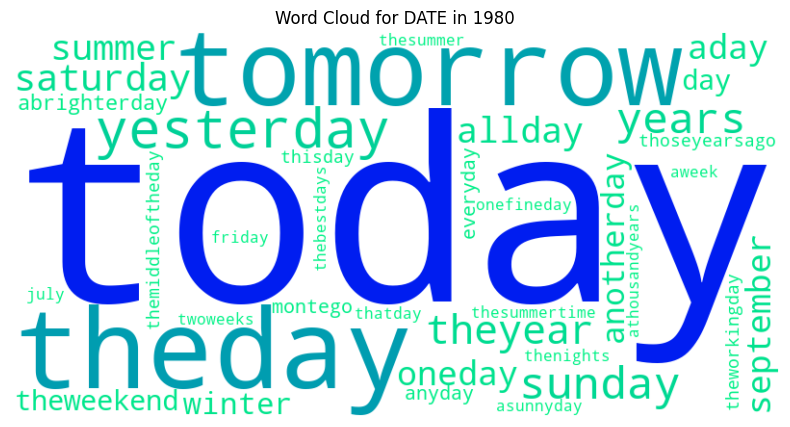

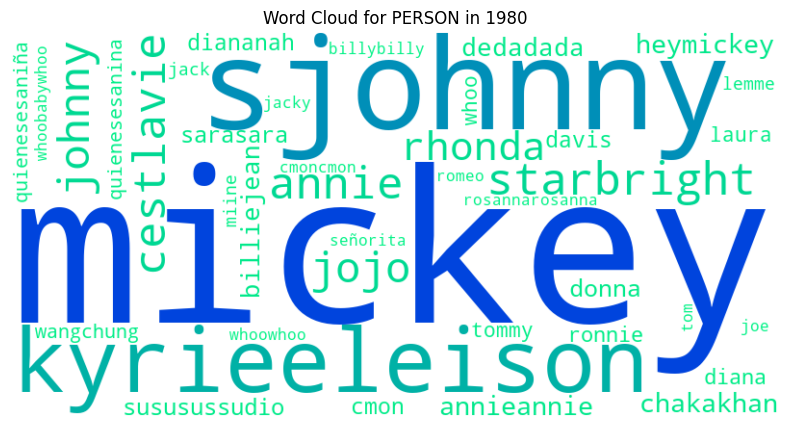

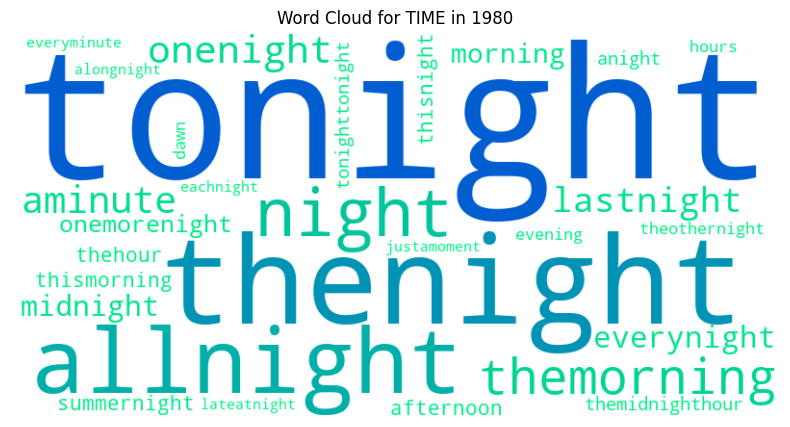

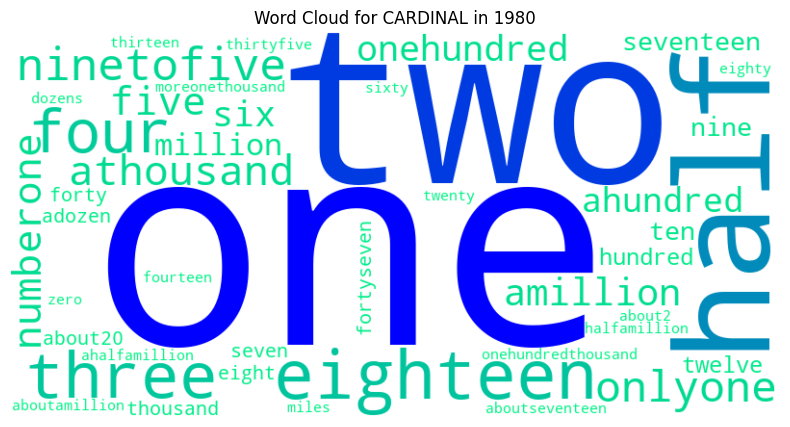

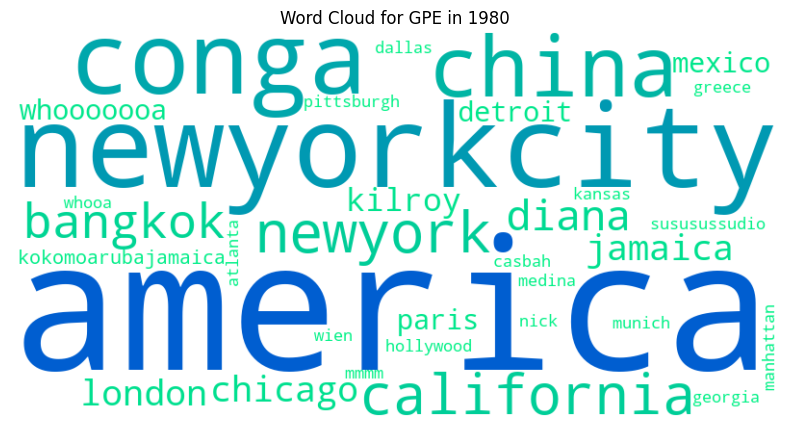

...

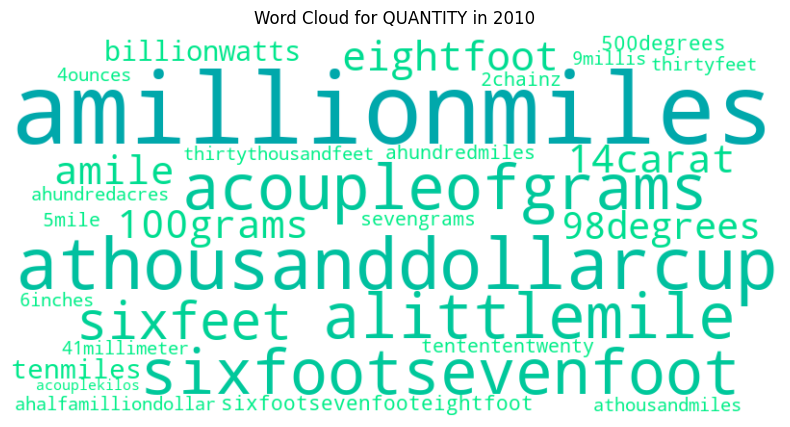

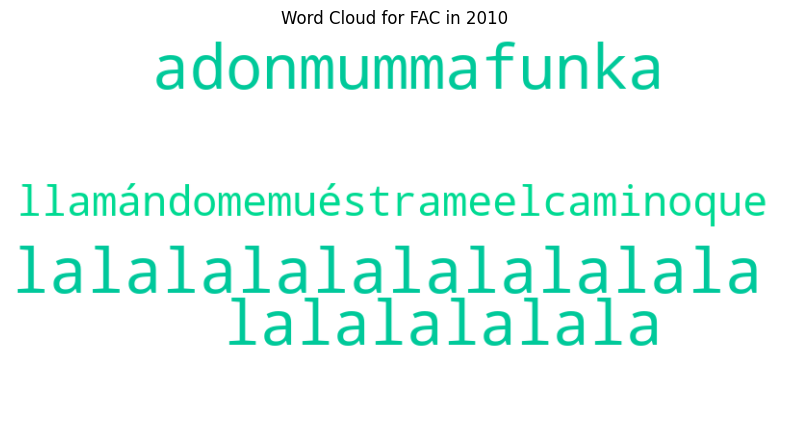

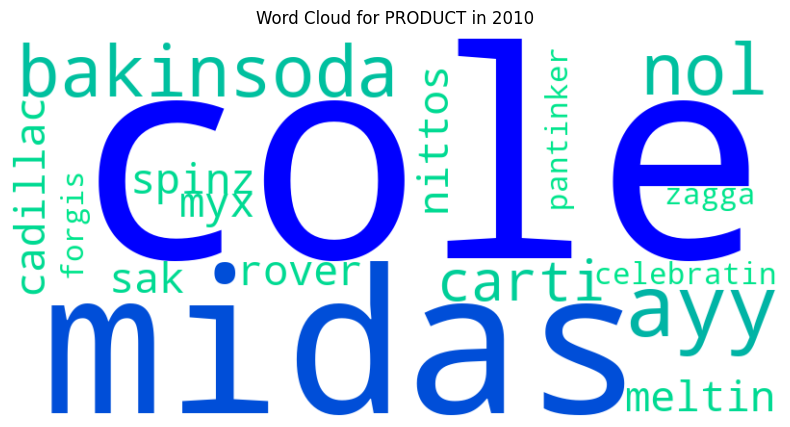

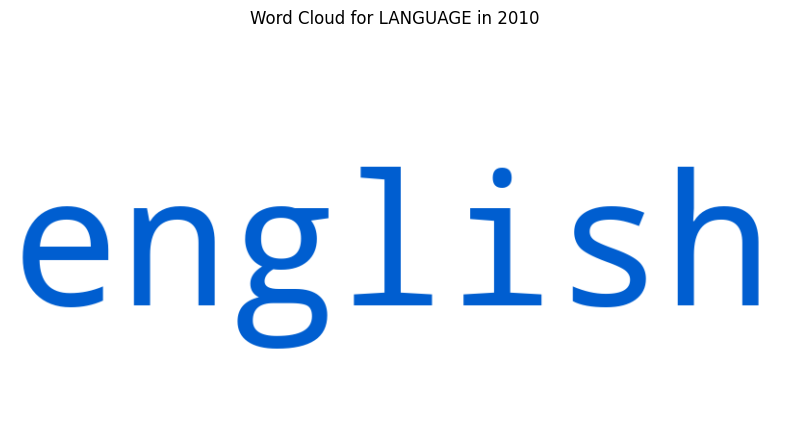

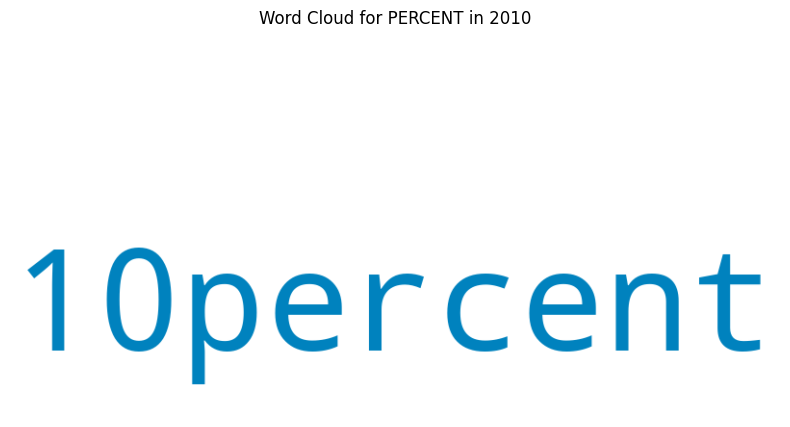

In [11]:
def generate_word_cloud(texts, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(texts)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()

class colormap_size_func(object):
    def __init__(self, colormap, max_font_size):
        import matplotlib.pyplot as plt
        self.colormap = plt.cm.get_cmap(colormap)
        self.max_font_size = max_font_size

    def __call__(self, word, font_size, position, orientation,
                 random_state=None, **kwargs):
        if random_state is None:
            random_state = Random()
        r, g, b, _ = 255 * np.array(self.colormap(font_size / self.max_font_size))
        return "rgb({:.0f}, {:.0f}, {:.0f})".format(r, g, b)

ents = ['LOC', 'NORP', 'PRODUCT', 'EVENT', 'PERSON', 'ORG', 'GPE']

# Generate word clouds for each decade
for decade, dfs in result_dfs.items():
    # generate_word_cloud(dfs['text'][f'{decade}_text_count'].to_dict(), f'Word Cloud for {decade}')

    # Generate word clouds for each entity type within the decade
    entity_text = Counter()

    for song in globals()[f'lyrics_{decade}']:
        # Filter out stopwords
        filtered_ents = [ent.text for ent in song.ents if ent.text.lower() not in stopwords.words('english')]

        for ent in song.ents:
            if ent.label_ not in entity_text:
                entity_text[ent.label_] = ""
            entity_text[ent.label_] += " " + (ent.text).replace(" ", "")

    for entity_type, text in entity_text.items():
        # Exclude common and uninformative entity types if needed
        if len(text) > 10:
            cmap = 'winter_r'
            wordcloud = WordCloud(width=800, height=400,
                                  background_color='white',
                                  collocations=False,
                                  prefer_horizontal=0.95,
                                  min_font_size=15,
                                  max_font_size=300,
                                  color_func=colormap_size_func(cmap, 300)
                ).generate_from_text(text)
            plt.figure(figsize=(10, 5))
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.axis('off')
            plt.title(f'Word Cloud for {entity_type} in {decade}')
            plt.show()